In [1]:
import warnings
warnings.filterwarnings('ignore')
import sys

sys.path.append('/data/yosef2/users/chenling/scVI/')
import scvi
print(scvi.__version__)

import os
os.getcwd()

0.5.0


'/data/yosef2/users/chenling/TabulaSapiens/CompartmentSplit/notebooks'

In [2]:
import logging
import os
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from hyperopt import hp

from scvi.inference import UnsupervisedTrainer, AlternateSemiSupervisedTrainer, SemiSupervisedTrainer
from scvi.models import VAE, SCANVI

from scvi.dataset.anndataset import AnnDatasetFromAnnData
import scanpy as sc
from anndata import read_h5ad
from anndata import AnnData

import matplotlib

In [3]:
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
%matplotlib inline

In [4]:
n_epochs = 150
save_path = '../../AnnotationsRound1/data/'
show_plot = True
test_mode = False
use_batches = True
use_cuda = True
lr = 1e-3
retrain=True

In [5]:
tissue = 'bladder'
capital_tissue = tissue[0].upper()+tissue[1:]

In [6]:
tenx = read_h5ad(save_path + 'tabula-sapiens-10X-pilot-filtered-%s.h5ad'%tissue)

In [7]:
save_path + 'tabula-sapiens-10X-pilot-filtered-%s.h5ad'%tissue

'../../AnnotationsRound1/data/tabula-sapiens-10X-pilot-filtered-bladder.h5ad'

In [8]:
ss2 = read_h5ad(save_path + 'tabula-sapiens-facs-pilot-filtered-%s.h5ad'%capital_tissue)

In [9]:
save_path + 'tabula-sapiens-facs-pilot-filtered-%s.h5ad'%capital_tissue

'../../AnnotationsRound1/data/tabula-sapiens-facs-pilot-filtered-Bladder.h5ad'

In [10]:
adata = tenx.concatenate(ss2)

In [11]:
data = AnnDatasetFromAnnData(adata, batch_label='batch')

[2019-12-06 15:04:25,037] INFO - scvi.dataset.dataset | Remapping labels to [0,N]
[2019-12-06 15:04:25,039] INFO - scvi.dataset.dataset | Remapping batch_indices to [0,N]
[2019-12-06 15:04:25,152] INFO - scvi.dataset.dataset | Computing the library size for the new data
[2019-12-06 15:04:25,266] INFO - scvi.dataset.dataset | Downsampled from 18231 to 18231 cells


In [12]:
data.subsample_genes(5000)

[2019-12-06 15:04:25,272] INFO - scvi.dataset.dataset | extracting highly variable genes


Transforming to str index.


[2019-12-06 15:04:37,260] INFO - scvi.dataset.dataset | Downsampling from 21301 to 5000 genes
[2019-12-06 15:04:37,452] INFO - scvi.dataset.dataset | Computing the library size for the new data
[2019-12-06 15:04:37,476] INFO - scvi.dataset.dataset | Filtering non-expressing cells.
[2019-12-06 15:04:37,497] INFO - scvi.dataset.dataset | Computing the library size for the new data
[2019-12-06 15:04:37,519] INFO - scvi.dataset.dataset | Downsampled from 18231 to 18231 cells


### This took about 7 minutes to train

In [13]:
vae = VAE(data.nb_genes, n_batch=data.n_batches * use_batches,
          n_layers=2, n_latent=30, dispersion='gene')
trainer = UnsupervisedTrainer(
    vae,
    data,
    train_size=0.9,
    use_cuda=use_cuda,
    frequency=5,
)

In [14]:
filename = '%s/vae.%s10xfacs.pkl'%(save_path,tissue)

if retrain==True:
    torch.manual_seed(0)
    trainer.train(n_epochs=n_epochs, lr=lr)
    torch.save(trainer.model.state_dict(), filename)

else:

    if os.path.isfile(filename):
        trainer.model.load_state_dict(torch.load(filename))
        trainer.model.eval()
    else:
        trainer.train(n_epochs=n_epochs, lr=lr)
        torch.save(trainer.model.state_dict(), filename)

# code for plotting elbo for training and testing data

(1000, 2000)

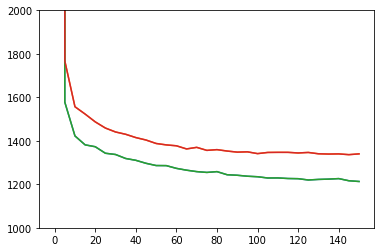

In [15]:
elbo_train_set = trainer.history["elbo_train_set"]
elbo_test_set = trainer.history["elbo_test_set"]
x = np.linspace(0, 150, (len(elbo_train_set)))
plt.plot(x, elbo_train_set)
plt.plot(x, elbo_test_set)
plt.ylim(3000, 11000)

elbo_train_set = trainer.history["elbo_train_set"]
elbo_test_set = trainer.history["elbo_test_set"]
x = np.linspace(0, 150, (len(elbo_train_set)))
plt.plot(x, elbo_train_set)
plt.plot(x, elbo_test_set)
plt.ylim(1000, 2000)

In [16]:
posterior = trainer.create_posterior(
        trainer.model, data, indices=np.arange(len(data))
    ).sequential()

latent, _, _ = posterior.get_latent()


# get imputed gene expression values

In [17]:
# imputed_values = posterior.sequential().imputation()
# normalized_values = posterior.sequential().get_sample_scale()

# using scVI latent space in scanpy

In [18]:
sc.pp.log1p(adata)
sc.pp.normalize_total(adata)

In [19]:
adata.obsm["X_scvi"] = latent
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30, use_rep="X_scvi")
sc.tl.umap(adata)

sc.tl.louvain(adata, key_added="louvain_scvi", resolution=1)

In [20]:
adata.obs.columns

Index(['10X_plate', 'BA_nM', 'NovaSeqRun', 'additional_notes',
       'anatomical_position', 'barcode', 'batch', 'bead_cleanup',
       'cDNA_dilute', 'cDNA_prep_person', 'excluded', 'investigator',
       'lib_prep_date', 'library_prep', 'method', 'n_genes', 'plate',
       'primary_sort', 'sex', 'sort_direction', 'sort_order', 'subjectid',
       'tissue', 'well', 'well_group', 'louvain_scvi'],
      dtype='object')

... storing '10X_plate' as categorical
... storing 'BA_nM' as categorical
... storing 'NovaSeqRun' as categorical
... storing 'additional_notes' as categorical
... storing 'anatomical_position' as categorical
... storing 'barcode' as categorical
... storing 'bead_cleanup' as categorical
... storing 'cDNA_dilute' as categorical
... storing 'cDNA_prep_person' as categorical
... storing 'excluded' as categorical
... storing 'investigator' as categorical
... storing 'lib_prep_date' as categorical
... storing 'library_prep' as categorical
... storing 'method' as categorical
... storing 'plate' as categorical
... storing 'primary_sort' as categorical
... storing 'sex' as categorical
... storing 'sort_direction' as categorical
... storing 'sort_order' as categorical
... storing 'subjectid' as categorical
... storing 'tissue' as categorical
... storing 'well' as categorical
... storing 'well_group' as categorical


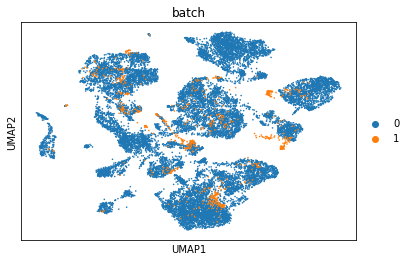

In [21]:
sc.pl.umap(adata, color=['batch'],s=10)

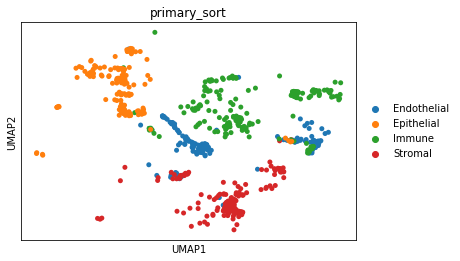

In [22]:
sc.pl.umap(adata[adata.obs['batch']=='1',:], color=['primary_sort'],s=100)

# Epithelium
|Cell type | number | marker genes|
|-----|-----|-------|
|Umbrella/Superficial	|	200|	UPK3A hi, UPK1A hi, KRT20 hi, COL17A1 lo|
|Intermediate	|	3130	|UPK mid, COL17A1 mid, KRT17 mid|
|Basal	|	600	|KRT14 -, COL17A1 hi, KRT17 hi, UPK lo|
|Basal stem cell	|	66.8	|KRT14 +, COL17A1 hi, KRT17 hi, UPK lo|


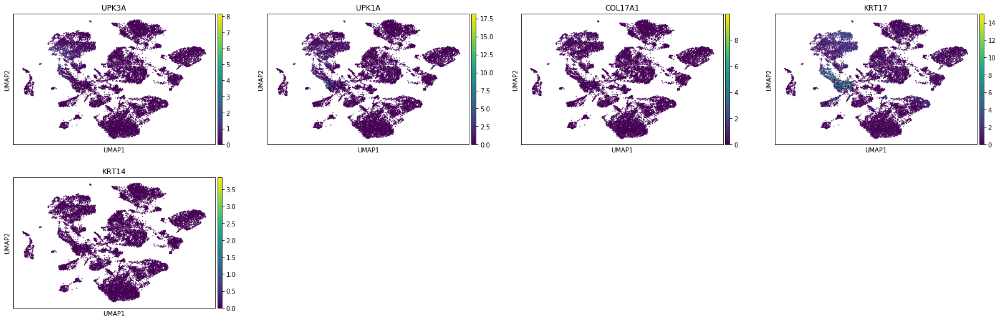

In [23]:
sc.pl.umap(adata, color=['UPK3A','UPK1A' ,'COL17A1','KRT17','KRT14'],s=10)

# Endothelium	
|Cell type | number | marker genes|
|-----|-----|-------|
|Artery	|3000	|VWF, NOTCH1|
|Vein	|	|	VWF, ACKR1|
|Lymphatic	|	|	VWF, LYVE1|
|Capillary	|	|	VWF, CA4|

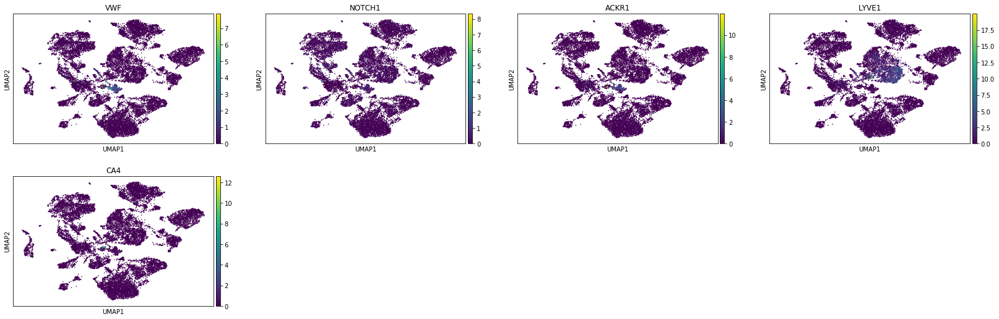

In [57]:
sc.pl.umap(adata, color=['VWF','NOTCH1' ,'ACKR1','LYVE1','CA4'],s=10)


# Stroma	
|Cell type | number | marker genes|
|-----|-----|-------|
|Vascular smooth muscle|	5000	|CNN1, ACTA2, TAGLN, NOTCH3|
|Skeletal muscle|		|	ACTA2, ACT|
|Fibroblast	|1333	|	DCN, PDGFRA, SCARA5|
|Myofibroblast|	667	|	DCN, PDGFRA, POSTN, ACTA2, MYH11|
|Pericyte		|	|PDGFRB, RGS5, DES|
|Adipocyte		|	| |

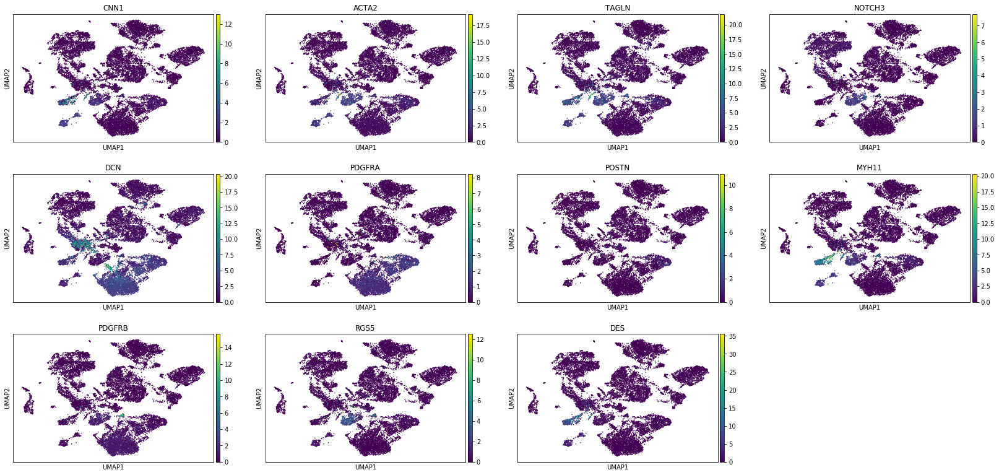

In [25]:
sc.pl.umap(adata, color=['CNN1','ACTA2' ,'TAGLN','NOTCH3','DCN','PDGFRA' ,'POSTN','MYH11','PDGFRB','RGS5','DES'],s=10)

In [26]:
['ACTA2' ,'TAGLN','DCN','PDGFRA']

['ACTA2', 'TAGLN', 'DCN', 'PDGFRA']

# PNS
|Cell type | number | marker genes|
|-----|-----|-------|
|Intrinsic Neuron (parasymphatetic)	| |VIP, NOS, NPY|
|Neuroendocrine| | |			
|Schwann	| |GAP43, MPZ|


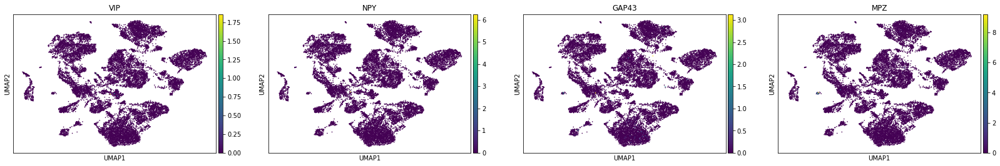

In [27]:
sc.pl.umap(adata, color=['VIP' ,'NPY','GAP43','MPZ'],s=10)

# Immune
|Cell type  | marker genes|
|-----|-------|
|B cell	|CD79a, CD24, MS4A1, CD19|
|Plasma Cell	|CD79a, CD27|
|CD8+ memory T cell	|CD3E, CD8|
|CD8+ naïve T cell	|CD3E, CD8|
|CD4+ memory T cell	|CD3E, CD4|
|CD4+ naïve T cell	|CD3E, CD4|
|NK cell	|KLRD1, NKG7|
|NKT cell	|CD3E, KLR1B, FCER1G|
|Neurtophil	|S100A8, S100A9, IFITM2, FCGR3B|
|Basophil	|MS4A2, CPA3, TPSAB1|
|Mast cell	|MS4A2, CPA3, TPSAB1|
|Eosinophil	|SIGLEC8|
|Megakaryocyte	|NRGN, PPBP, PF4, OST4|
|Macrophage	|CD163, MARCO, MSR1, MRC1|
|pDC	|LILRB4, IRF8, LILRA4|
|mDC1	|CD1, CLED9A, LAMP3|
|mDC2	|CD1, PKIIB|
|Classical Monocyte	|CD14, CD16|
|Nonclassical monocyte	|CD163, MARCO, MSR1, MRC1|

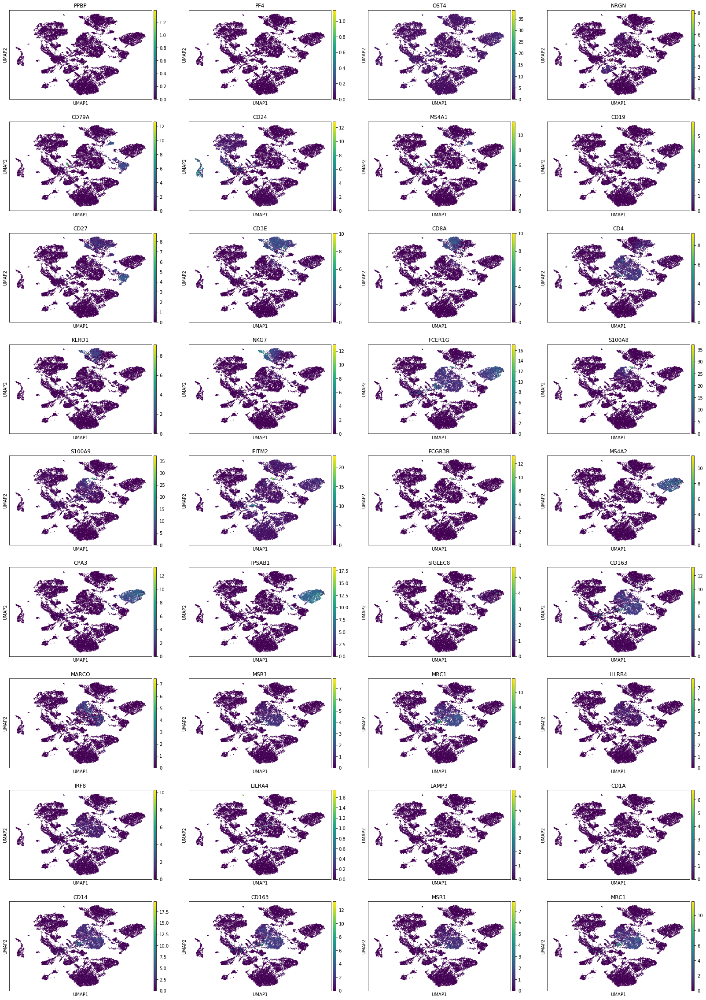

In [28]:
genelist = ['PPBP','PF4','OST4','NRGN',
            'CD79A','CD24','MS4A1','CD19',
           'CD27','CD3E','CD8A','CD4','KLRD1','NKG7','FCER1G',
           'S100A8','S100A9','IFITM2','FCGR3B',
           'MS4A2','CPA3','TPSAB1','SIGLEC8','CD163','MARCO','MSR1','MRC1',
           'LILRB4','IRF8','LILRA4','LAMP3','CD1A','CD14',
           'CD163','MSR1','MRC1']
sc.pl.umap(adata, color=genelist,s=10)

In [29]:
# pancreas contamination

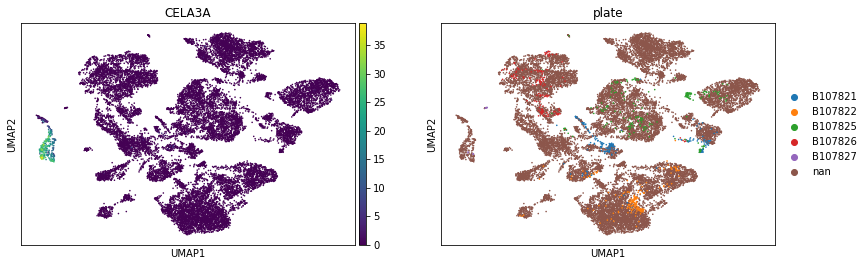

In [30]:
genelist = ['CELA3A','plate']
sc.pl.umap(adata, color=genelist,s=10)

# use scANVI to split compartment, then perform leiden clustering on each compartment

In [31]:
data.cell_types

array(['undefined'], dtype='<U128')

In [32]:
data.cell_types, data.labels = np.unique(adata.obs['primary_sort'].values, return_inverse=True)
data.labels = data.labels.reshape(len(data.labels),1)
data.n_labels = len(data.cell_types)

In [33]:
np.unique(data.batch_indices,return_counts=True)

(array([0, 1], dtype=uint16), array([17469,   762]))

In [34]:
scanvi = SCANVI(data.nb_genes, data.n_batches, data.n_labels, n_layers=2,n_latent=30)
scanvi.load_state_dict(posterior.model.state_dict(), strict=False)
trainer_scanvi = AlternateSemiSupervisedTrainer(scanvi, data, classification_ratio=0,
                                                n_epochs_classifier=100, lr_classification=5 * 1e-3)

nan_idx = list(data.cell_types).index('nan')
islabelled = np.logical_and((data.batch_indices.ravel() == 1), data.labels.ravel()!= nan_idx )
notlabelled = np.logical_or((data.batch_indices.ravel() == 0), data.labels.ravel()== nan_idx )

labelled = np.where(islabelled)[0]
labelled = np.random.choice(labelled, len(labelled), replace=False)
trainer_scanvi.labelled_set = trainer_scanvi.create_posterior(indices=labelled)
trainer_scanvi.unlabelled_set = trainer_scanvi.create_posterior(indices=notlabelled)
trainer_scanvi.train(n_epochs=3)

full = trainer_scanvi.create_posterior(trainer_scanvi.model, data, indices=np.arange(len(data)))
_, labels_pred = full.sequential().compute_predictions()

In [35]:
adata.obs['compartment_pred'] = data.cell_types[labels_pred]

# color by predicted compartments

Trying to set attribute `.obs` of view, making a copy.
... storing 'compartment_pred' as categorical


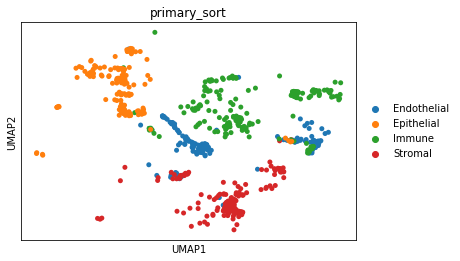

In [36]:
sc.pl.umap(adata[adata.obs['batch']=='1',:], color=['primary_sort'],s=100)

... storing 'compartment_pred' as categorical


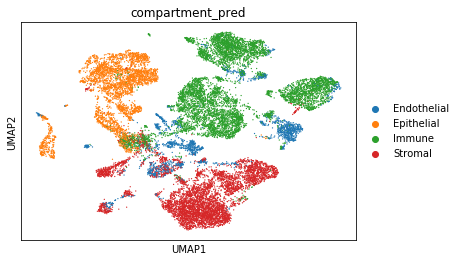

In [37]:
sc.pl.umap(adata, color=['compartment_pred'],ncols=1)

# seed labeling with compartment markers

In [38]:
compartments = {'Epithelial':['UPK3A','UPK1A' ,'COL17A1','KRT17','KRT14'], 
                'Endothelial':['PECAM1','CLDN5','CDH5','VWF'],
                'Stromal':['ACTA2' ,'TAGLN','DCN','PDGFRA'],
               'Immune':['PTPRC','RAC2','LCP1'] ,
               'PNS':['VIP' ,'NPY','GAP43','MPZ'],
               'Pancreas':['CELA3A']}

In [39]:
for x in compartments.keys():
    sc.tl.score_genes(adata, ctrl_size=100, gene_list=compartments[x],score_name = x)

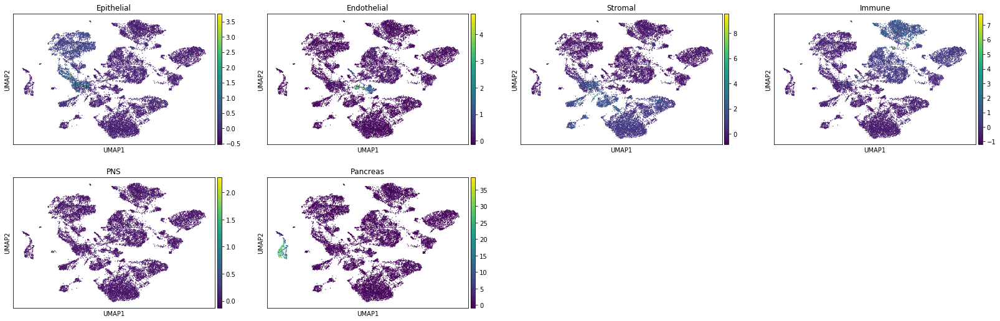

In [40]:
sc.pl.umap(adata, color=compartments.keys())

In [41]:
for x in compartments.keys():
    indicator = x+'_label'
    # compute gene signature scores
    sc.tl.score_genes(adata, compartments[x], score_name=x)
    cutoff = np.min(adata.obs.nlargest(2000,x)[x].values)
    if x=='PNS':
        cutoff = np.min(adata.obs.nlargest(50,x)[x].values)
    if x=='Pancreas':
        cutoff = np.min(adata.obs.nlargest(50,x)[x].values)
    if x=='Endothelial':
        cutoff = np.min(adata.obs.nlargest(100,x)[x].values)
    adata.obs[indicator] = (adata.obs[x].values>cutoff).astype(str)


... storing 'Epithelial_label' as categorical
... storing 'Endothelial_label' as categorical
... storing 'Stromal_label' as categorical
... storing 'Immune_label' as categorical
... storing 'PNS_label' as categorical
... storing 'Pancreas_label' as categorical


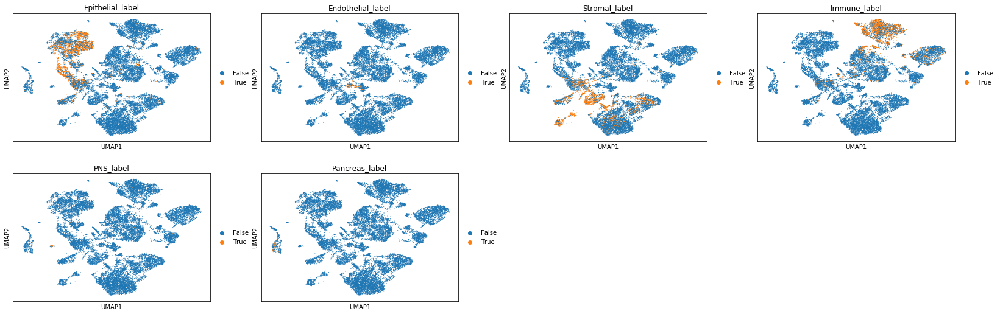

In [42]:
labelled = [x+'_label' for x in compartments.keys()]
sc.pl.umap(adata, color=labelled)

In [43]:
all_indicators = pd.concat([adata.obs[x+'_label'] for x in compartments.keys()], axis = 1)
unique_celltypes = ((all_indicators.values=='True').sum(axis=1) <=1 )

labels = np.repeat(0, data.X.shape[0])
for i, c in enumerate(compartments.keys()):
    idx = np.where(
        np.logical_and(
        unique_celltypes, 
        adata.obs[c+'_label'].values=='True'))[0]
    labels[idx] = i+1

data.cell_types = ['unlabelled']+list(compartments.keys())
data.labels = labels.reshape(len(labels),1)
data.n_labels = len(data.cell_types)

labelled = np.where(data.labels.ravel()!=0)[0]
labelled = np.random.choice(labelled, len(labelled), replace=False)

unlabelled = np.where(data.labels.ravel()==0)[0]
unlabelled = np.random.choice(unlabelled, len(unlabelled), replace=False)


In [44]:
np.unique(labels, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6]),
 array([12528,  1811,    86,  1806,  1909,    44,    47]))

In [45]:

labels_pred = []
scanvi = SCANVI(data.nb_genes, data.n_batches, data.n_labels, n_layers=2,n_latent=30, symmetric_kl=True)
filename = '%s/vae.%s10xfacs.pkl'%(save_path,tissue)
scanvi.load_state_dict(torch.load(filename), strict=False)
trainer_scanvi = SemiSupervisedTrainer(scanvi, data, n_epochs_classifier=50, lr_classification=5 * 1e-3)

trainer_scanvi.labelled_set = trainer_scanvi.create_posterior(indices=labelled)
trainer_scanvi.unlabelled_set = trainer_scanvi.create_posterior(indices=unlabelled)
trainer_scanvi.train(n_epochs=15)
full = trainer_scanvi.create_posterior(trainer_scanvi.model, data, indices=np.arange(len(data)))
_, pred = full.sequential().compute_predictions()

... storing 'comp_pred' as categorical


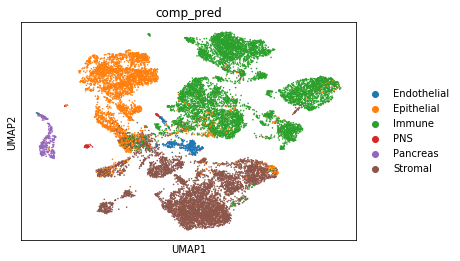

In [46]:
adata.obs['comp_pred'] = [data.cell_types[i] for i in pred]
sc.pl.umap(adata, color=['comp_pred'],  show=show_plot,size=10)

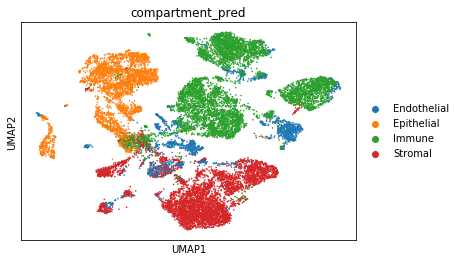

In [47]:
sc.pl.umap(adata, color=['compartment_pred'],  show=show_plot,size=10)

# plotting cell cycle changes

In [48]:
g1s_genes =  ['MCM5','PCNA','TYMS','FEN1','MCM2','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1','UHRF1','MLF1IP','HELLS','RFC2','RPA2','NASP',
         'RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7','POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
         'USP1','CLSPN','POLA1','CHAF1B','BRIP1','E2F8']

g2m_genes = ['HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B','MKI67','TMPO','CENPF','TACC3','FAM64A','SMC4','CCNB2',
        'CKAP2L','CKAP2','AURKB','BUB1','KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','HJURP','CDCA3','HN1','CDC20','TTK','CDC25C','KIF2C',
        'RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1','ANLN','LBR','CKAP5','CENPE','CTCF','NEK2','G2E3','GAS2L3',
        'CBX5','CENPA']


In [49]:
sc.tl.score_genes_cell_cycle(adata, s_genes=g1s_genes, g2m_genes=g2m_genes)


... storing 'phase' as categorical


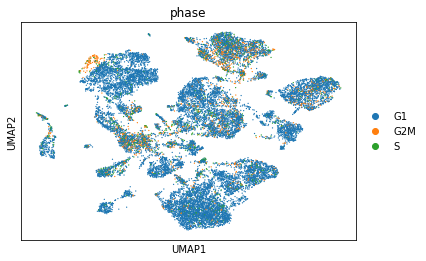

In [50]:
sc.pl.umap(adata,color=['phase'])

# differential expression

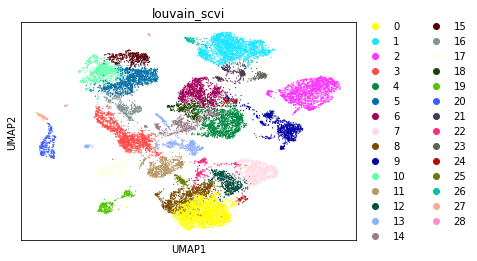

In [51]:
sc.pl.umap(adata, color=['louvain_scvi'],ncols=1)

In [52]:
sc.tl.rank_genes_groups(
    adata,
    "louvain_scvi",
    method="wilcoxon",
    use_raw=False,
    key_added="rank_genes_groups_wilcox",
    n_genes=adata.shape[1],
)

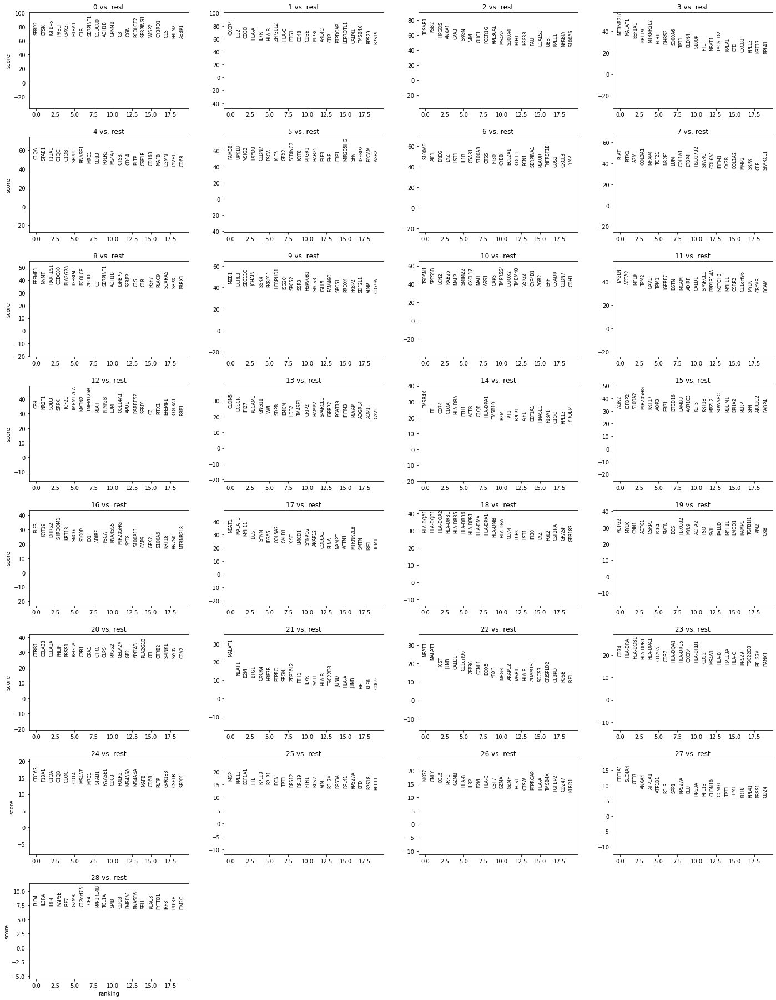

In [53]:
sc.pl.rank_genes_groups(
    adata, key="rank_genes_groups_wilcox", sharey=False
)

In [54]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
result = adata.uns['rank_genes_groups_wilcox']
groups = result['names'].dtype.names
sapiens_rank_genes_scores = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores','pvals']})
sapiens_rank_genes_scores.to_csv('%s.wilcoxon.csv'%tissue)

In [55]:
sapiens_rank_genes_scores

,0_n,0_s,0_p,1_n,1_s,1_p,2_n,2_s,2_p,3_n,3_s,3_p,4_n,4_s,4_p,5_n,5_s,5_p,6_n,6_s,6_p,7_n,7_s,7_p,8_n,8_s,8_p,9_n,9_s,9_p,10_n,10_s,10_p,11_n,11_s,11_p,12_n,12_s,12_p,13_n,13_s,13_p,14_n,14_s,14_p,15_n,15_s,15_p,16_n,16_s,16_p,17_n,17_s,17_p,18_n,18_s,18_p,19_n,19_s,19_p,20_n,20_s,20_p,21_n,21_s,21_p,22_n,22_s,22_p,23_n,23_s,23_p,24_n,24_s,24_p,25_n,25_s,25_p,26_n,26_s,26_p,27_n,27_s,27_p,28_n,28_s,28_p
0,SFRP2,69.107269,0.000000e+00,CXCR4,66.699913,0.000000e+00,TPSAB1,60.670540,0.000000e+00,MTRNR2L8,36.913788,2.777044e-298,C1QA,50.796394,0.000000e+00,FAM3B,49.473755,0.000000e+00,S100A9,47.571598,0.000000e+00,PLAT,44.160645,0.000000e+00,EFEMP1,37.557705,1.054672e-308,MZB1,43.855053,0.000000e+00,TSPAN1,40.947315,0.000000e+00,TAGLN,38.658298,0.000000e+00,CFH,34.072098,1.910868e-254,CLDN5,25.594364,1.762687e-144,TMSB4X,26.269793,4.247232e-152,AGR2,32.653027,7.258733e-234,ELF3,28.217924,3.524528e-175,NEAT1,31.960197,3.898781e-224,HLA-DQA1,29.171310,4.484309e-187,ACTG2,27.306425,3.558231e-164,CTRB1,27.354740,9.484109e-165,MALAT1,23.031605,2.249084e-117,NEAT1,23.761320,8.392627e-125,CD74,19.414459,5.824610e-84,CD163,14.067967,5.976210e-45,MGP,16.430504,1.156919e-60,NKG7,16.193071,5.644037e-59,EEF1A1,11.506509,1.223316e-30,PLD4,7.507836,6.011271e-14
1,CTSK,68.234184,0.000000e+00,IL32,62.418957,0.000000e+00,TPSB2,60.079285,0.000000e+00,MALAT1,36.513802,6.697277e-292,STAB1,49.484737,0.000000e+00,UPK1B,49.130470,0.000000e+00,AIF1,45.841648,0.000000e+00,PITX1,41.749954,0.000000e+00,NNMT,37.311943,1.050807e-304,DERL3,41.901951,0.000000e+00,SPTSSB,40.529503,0.000000e+00,ACTA2,37.914455,0.000000e+00,NR2F1,33.020679,4.101495e-239,ECSCR,23.553314,1.160908e-122,FTL,23.425884,2.328690e-121,IGFBP2,32.019428,5.851408e-225,KRT19,25.502298,1.858888e-143,MALAT1,30.707458,4.525565e-207,HLA-DQB1,29.139475,1.135753e-186,MYLK,27.039268,5.107656e-161,CELA3B,27.353525,9.805037e-165,NEAT1,12.789504,1.876671e-37,MALAT1,22.093500,3.649880e-108,HLA-DRA,19.067724,4.682428e-81,F13A1,13.982901,1.982400e-44,RPL13,15.539360,1.878513e-54,GNLY,16.080702,3.484139e-58,SLC4A4,11.410811,3.692664e-30,IL3RA,7.502908,6.241747e-14
2,IGFBP6,68.161690,0.000000e+00,CD3D,61.728004,0.000000e+00,HPGDS,57.781338,0.000000e+00,EEF1A1,34.028484,8.447601e-254,F13A1,49.362785,0.000000e+00,VSIG2,48.742611,0.000000e+00,EREG,45.420300,0.000000e+00,A2M,41.535957,0.000000e+00,RARRES1,36.923698,1.925505e-298,SEC11C,41.619564,0.000000e+00,LCN2,40.326790,0.000000e+00,MYL9,37.701065,0.000000e+00,SOD3,32.985668,1.303799e-238,IFI27,22.928953,2.390083e-116,CD74,23.037855,1.946983e-117,S100A2,31.949720,5.451036e-224,DHRS2,24.913933,5.255680e-137,MYH11,29.029982,2.753923e-185,HLA-DQA2,28.965446,1.793243e-184,CNN1,26.969168,3.399963e-160,CELA3A,27.353369,9.847125e-165,B2M,11.541179,8.179679e-31,XIST,18.352005,3.181544e-75,HLA-DQB1,18.636379,1.628980e-77,C1QA,13.818264,1.977814e-43,EEF1A1,15.284898,9.641459e-53,CCL5,15.734890,8.720800e-56,CFTR,10.629395,2.175190e-26,IRF4,7.441587,9.948235e-14
3,PRELP,67.783134,0.000000e+00,HLA-A,58.630928,0.000000e+00,ANXA1,55.260868,0.000000e+00,KRT19,30.410805,3.953515e-203,C1QC,49.149319,0.000000e+00,FXYD3,48.719082,0.000000e+00,LYZ,45.110405,0.000000e+00,COL3A1,39.038342,0.000000e+00,CCDC80,36.823364,7.807049e-297,JCHAIN,41.556107,0.000000e+00,RAB25,39.992672,0.000000e+00,TPM2,36.580513,5.838153e-293,SRPX,32.796490,6.606915e-236,PECAM1,22.762728,1.073553e-114,C1QA,22.575977,7.464234e-113,MIR205HG,31.795397,7.494506e-222,SHROOM1,23.235172,2.009181e-119,DES,27.018045,9.071588e-161,HLA-DRB1,28.749279,9.247655e-182,ACTC1,26.795948,3.602488e-158,PNLIP,27.352587,1.006029e-164,BTG1,11.525729,9.787980e-31,JUNB,17.053913,3.268927e-65,HLA-DPB1,18.332436,4.560178e-75,C1QB,13.805380,2.365235e-43,FTL,15.206505,3.201896e-52,PRF1,14.974353,1.080146e-50,ANXA4,8.964325,3.121870e-19,NAPSB,7.389121,1.478027e-13
4,GPX3,67.713898,0.000000e+00,IL7R,58.006165,0.000000e+00,CPA3,54.350140,0.000000e+00,MTRNR2L2,29.540674,8.653298e-192,C1QB,48.968117,0.000000e+00,CLDN7,48.158707,0.000000e+00

In [56]:
adata.write('%s.scVI.h5ad'%tissue)